## Experimento inicial: cuantos datos cogemos para entrenar el modelo

A continuación cogeremos una variable que está completa: 'site-weather.csv' e introduciremos un hueco de longitud de 1 día a 10 días, en una ubicación aleatoria, siempre considerando que hay suficiente información antes y detrás. Y comprobaremos cómo funciona el algoritmo desarrollado al entrenar los modelos con distinto número de datos: por cada día que haya en el hueco un día de datos, dos días, una semana, dos semanas y tres semanas (esto será básicamente la serie temporal completa).

Este experimento se ha realizado previamente en el fichero '../experimento.ipynb', pero en este caso tomaremos también datos de MAE Y MAPE. Hemos creado un fichero independiente para poder ejecutar los tres experimentos a la vez.



In [1]:
# Basic imports
import csv
import numpy as np
import pandas as pd
from pandas import Series
import datetime
import time
import os
import math
import seaborn as sns

path = "../../../data" #Path with raw csv files
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot
from sklearn.impute import KNNImputer

from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
files = os.listdir(path)
path_postprocess = path + "_postprocess"
#in the cleaning code we insert the rows that are apparently missing

freqs = {'zone_co2.csv':'1min', 'ele.csv': '15min', 'zone_temp_sp_c.csv':'5min', 'occ.csv':'1min', 'zone_temp_exterior.csv':'1min', 'zone_temp_sp_h.csv':'5min', 'site_weather.csv':'15min', 'wifi.csv': '10min', 'zone_temp_interior.csv':'10min'}
starts = {'ele.csv': '2018/1/1 1:00', 'zone_temp_sp_c.csv':'2018/9/15 10:00', 'occ.csv':'2018-05-22 07:00:00', 'zone_temp_exterior.csv':'2018-01-01 00:00:00', 'zone_temp_sp_h.csv':'2018/9/15 10:00', 'site_weather.csv':'2018-01-01 00:00:00', 'wifi.csv': '2018/5/22 00:00', 'zone_temp_interior.csv':'2018-02-22 00:30:00'}
ends = {'ele.csv': '2021/1/1 0:00', 'zone_temp_sp_c.csv':'2021/1/1 0:00', 'occ.csv':'2019-02-21 10:12:00', 'zone_temp_exterior.csv':'2021-01-01 00:00:00', 'zone_temp_sp_h.csv':'2021/1/1 0:00', 'site_weather.csv':'2021-01-01 00:00:00', 'wifi.csv': '2018/7/11 23:50', 'zone_temp_interior.csv':'2021-01-01 00:00:00'}

## Funciones diseñadas:

In [2]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from prophet import Prophet
import random
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error


In [3]:
def interpolate_Prophet(df,i, start_index, end_index):
    m = Prophet()
    s=start_index+1
    e = end_index
    
    df_medio= df.iloc[s:e, i]


    df_prophet = df[df[df.columns[i]].notna()][['date', df.columns[i]]]
    df_medio = df.iloc[s:e, [0, i]]
    df_prophet.columns = ['ds', 'y']
    m.fit(df_prophet)


    future = df_medio[['date']]
    future.columns=['ds']
    forecast_antes = m.predict(future)[['ds', 'yhat']]
    gap = forecast_antes['yhat']
    return gap

In [4]:
def interpolate_ML(df,i, start_df, end_df, start_index, end_index):
    #PASO 1: OBTENER DATOS ANTES Y DESPUÉS



    #print("Gap: \ndf before[", start_df, ':', 'start_index', start_index, ']\ndf after[', end_index, ':', end_df, ']')
    s=start_index+1
    e = end_index


    df_antes = df.iloc[start_df:s, i]
    df_despues= df.iloc[e:end_df, i].loc[::-1]
    df_medio= df.iloc[s:e, i]
    #print("Df_antes: ", df_antes.shape[0], "Df_medio: ", df_medio.shape[0], "Df_despues: ", df_despues.shape[0])

    assert df_medio.shape[0]+df_despues.shape[0]+df_antes.shape[0]==end_df-start_df
    # PASO 2: CREAR DATAFRAMES !!! SI el de después  es menor que el medio (antes siempre tenemos el resto del df), solamente ejecutamos con el de después
    if (df_despues.shape[0]<df_medio.shape[0]):
        print("Solo usamos datos anteriores")
        
        T = df_medio.shape[0]
        a = np.array(df_antes)
        train_antes =np.lib.stride_tricks.sliding_window_view(a, T+1)[:-1]
        test_antes = a[T+1:]

        svr_antes = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))
        svr_antes.fit(train_antes, test_antes)

        start = start_index-start_df
        for i in range(T):
            at = a[start-T-1+i:start+i]
            a=np.append(a,svr_antes.predict(at.reshape(1,-1)))
        gap=a[start:start+T]
        
        

    else:
        # Creamos los dataframes
        a = np.array(df_antes)
        b=np.array(df_despues)
        T = df_medio.shape[0]

        train_antes =np.lib.stride_tricks.sliding_window_view(a, T+1)[:-1]
        test_antes = a[T+1:]
        #print("train_antes, ", len(train_antes), "test_antes, ", len(test_antes))
        train_despues = np.lib.stride_tricks.sliding_window_view(b, T+1)[:-1]
        test_despues = b[T+1:]

        # PASO 3: ENTRENAR MODELOS


        svr_antes = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))

        svr_antes.fit(train_antes, test_antes)
        svr_despues = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))

        svr_despues.fit(train_despues, test_despues)

        # PASO 4: OBTENER PREDICCIONES

        
        start = start_index-start_df
        for i in range(T):
            at = a[start-T-1+i:start+i]
            a=np.append(a,svr_antes.predict(at.reshape(1,-1)))

            dp = b[df_despues.shape[0]-T-1+i:df_despues.shape[0]+i]
            b=np.append(b,svr_despues.predict(dp.reshape(1,-1)))
        
        # PASO 5: COMBINAR
        predictions_antes = a[start:start+T]
        predictions_despues = b[df_despues.shape[0]:df_despues.shape[0]+T]
        gap=(predictions_antes+predictions_despues[::-1])/2
    return gap

In [5]:
def obtain_data(df, i):



    #print("Estamos en: ", i)
    k = 0

    start_index = {}
    starttime = {}
    end_index = {}
    endtime = {}
    tipo = {}

    k2 =0
    start_index_peque = {}
    starttime_peque = {}
    end_index_peque = {}
    endtime_peque = {}


    gap = {}
    start_gap_index =0
    end_gap_index =0
    start_gap_dt=datetime.datetime.strptime(str(df.iloc[0,0]), '%Y-%m-%d %H:%M:%S')
    end_gap_dt = datetime.datetime.strptime(str(df.iloc[0,0]), '%Y-%m-%d %H:%M:%S')
    for j in range(0, len(df.index)):
        

        if (pd.isnull(df.iloc[j,i]) or math.isnan(df.iloc[j,i]))and pd.isnull(df.iloc[j-1,i]) == False:
            start_gap_index = j-1
            start_gap_dt = datetime.datetime.strptime(str(df.iloc[j-1,0]), '%Y-%m-%d %H:%M:%S')
            starttime[k]=df.iloc[j-1,0] #start time of the gap
            start_index[k]=j-1
        elif (pd.isnull(df.iloc[j-1,i]) or math.isnan(df.iloc[j-1,i])) and pd.isnull(df.iloc[j,i]) == False:
            end_gap_index = j
            end_gap_dt=datetime.datetime.strptime(str(df.iloc[end_gap_index,0]), '%Y-%m-%d %H:%M:%S')
            if (abs(end_gap_dt-start_gap_dt).total_seconds()<3600):
                start_index_peque[k2] = start_gap_index
                end_index_peque[k2]=end_gap_index
                starttime_peque[k2]= df.iloc[start_gap_index,0]
                endtime_peque[k2]= df.iloc[end_gap_index,0]
                k2=k2+1
            else:
                start_index[k] = start_gap_index
                end_index[k]=end_gap_index
                starttime[k]= df.iloc[start_gap_index,0]
                endtime[k]= df.iloc[end_gap_index,0]
                tipo[k] = abs((end_gap_dt-start_gap_dt).days)+1
                
                k=k+1
    return [(start_index, end_index,tipo ), (start_index_peque, end_index_peque)]
    



In [6]:
def fill_small_gaps(df, start_index_peque, end_index_peque, i):
    k2 = len(start_index_peque)
    if k2!=0:
        for m in range(k2): 
            df.iloc[start_index_peque[m]:end_index_peque[m]+1,i]=df.iloc[start_index_peque[m]:end_index_peque[m]+1,i].interpolate(method='linear')

In [7]:
def mix_big_gaps(start_index, end_index, tipo, freq=4):
    k = len(start_index)
    gaps = {}
    days_interpolation ={}
    t =0
    m =0
    if k!=0:
        while (m<k):
            #print("Estoy en: ", m)
            gap = m
            next_gap = m+1 
            start = start_index[m]
            end_index_t = end_index[m]
            current_gap = [[start_index[m], end_index[m], 0, end_index[m]-start_index[m]]]
            type = tipo[m]
            T = abs(end_index[m]-start_index[m])
            
            while (next_gap<k and abs(end_index_t-start_index[next_gap])<T ):
                #print("Fusión en: ", gap, "con ", next_gap)
                #print("T: ", abs(end_index_t-start))
                m= m+1
                local_index = current_gap[-1][3]+(start_index[next_gap]-end_index_t)
                #Si está muy cerca se lo metemos al current_gap
                current_gap.append([start_index[next_gap], end_index[next_gap], local_index,local_index+(end_index[next_gap]-start_index[next_gap])])
                
                type = type + tipo[m]
                end_index_t = end_index[next_gap]
                next_gap= next_gap +1
                T = abs(end_index_t-start)
                
            m = m+1
            gaps[t]=current_gap
            days_interpolation[t]=type
            t=t+1   
        return (gaps, days_interpolation)


In [8]:
def fill_big_gaps(df, gaps, days_interpolation, i, freq=4):
    k = len(gaps)
    if k!=0:
        for m in range(k):
            
            days = days_interpolation[m]
            start_i = gaps[m][0][0]
            end_i = gaps[m][-1][1]
            #print("We are in gap: ", m, "\nMixed gaps: ", gaps[m])
            #print("Gap of " , days, 'days')

            end_gap_anterior = (gaps[m-1][-1][1])if m>0 else 0
            start_gap_siguiente = (gaps[m+1][0][0])if m+1!=k else len(df.index)
            # Si el anterior ha acabado hace más de una semana, nos quedamos con el que se hace una semana justa

            start_df = start_i-(days*7*freq*24) if (start_i-days*7*freq*24>=0 ) else 0
            
            
            # Si el sigueinte empieza más tarde de una semana, nos quedamos con la semana siguiente solamente
            end_df = end_i+(days*7*freq*24) if (start_gap_siguiente-end_i > days*7*freq*24 ) else start_gap_siguiente
            results = interpolate_ML(df,i, start_df, end_df, start_i, end_i)
            pos =0
            for independent_gap in gaps[m]:
                
                df.iloc[independent_gap[0]+1:independent_gap[1],i]=results[independent_gap[2]:independent_gap[3]-1]
            
                
        
        

In [9]:
def clean_df_var(df, i, show=False):
    copia = df[['date', df.columns[i]]].copy()
    data = obtain_data(df, i)
    start_index, end_index,tipo = data[0]
    start_index_peque, end_index_peque=data[1]
    fill_small_gaps(df, start_index_peque, end_index_peque, i)
    gaps, days_interpolation = mix_big_gaps(start_index, end_index, tipo)
    fill_big_gaps(df, gaps, days_interpolation, i)
    print("Finished: ", df.columns[i])
    if(show):
        fig = make_subplots(rows=2, cols=1,  shared_xaxes=True, subplot_titles=("Bruto",  "Final") )


        fig.add_trace(
            go.Scatter(x=copia.date , y=copia[df.columns[i]]),
            row=1, col=1
        )

        fig.add_trace(
            go.Scatter(x=df.date , y=df[df.columns[i]]),
            row=2, col=1
        )



        fig.update_layout(legend_orientation="h", 
                    xaxis2_rangeslider_visible=True, xaxis2_rangeslider_thickness=0.1, height=600, width=800, title_text="Mels_S" )
        fig.show()


## Ejecución del experimento

In [10]:
file = 'site_weather.csv'
df = pd.read_csv(path+'/'+file)
path_2 = '../data_postprocess/data_done'
print(path+'/'+file)
start = starts[file]
end = ends[file]
freq = freqs[file]
df['date'] = pd.to_datetime(df['date']) 
df =df[(df.date>=start)&(df.date<=end)]
helper=pd.DataFrame({'date': pd.date_range(start, end, freq=freq)})
df = pd.merge(df, helper, on='date', how='outer').sort_values('date')

df.sort_values(by='date', inplace=True)
df = df[df.date <= '2020-03-01']

df.head()
var='air_temp_set_1'

fig = go.Figure()
fig.add_trace(
    go.Scatter(x=df.date , y=df[var])
)
fig.update_layout(legend_orientation="v", 
             xaxis_rangeslider_visible=True, xaxis_rangeslider_thickness=0.1, height=600, width=1000 )
fig.show()
#  Vamos a probar haciendo downsampling a 15 minutos


../../../data/site_weather.csv


In [11]:
df = df[['date', var]]
copia = df.copy()
copia.set_index('date', inplace=True)

In [12]:
def experimento_inicial(iteraciones, longitud, copia, freq=4):
    tiempos=[[],[],[],[],[],[]]
    mse =[[],[],[],[],[],[]]
    mae=[[],[],[],[],[],[]]
    mape = [[],[],[],[],[],[]]
    
    print("Longitud: ", longitud)
    for j in range(iteraciones):

        print("\nINFORMACIÓN ITERACIÓN ", j)
        df = copia.copy()
        df.reset_index(inplace=True)
        
        
        index_inicial = np.random.randint(longitud, len(df.index)-2*longitud)
        #print("Índice inicial: ", index_inicial)
        #Insertamos valores nulos
        df.iloc[index_inicial:index_inicial+longitud, 1] = np.nan
        df1 = df.copy()
    
        index_final = index_inicial+longitud


        data = obtain_data(df, 1)
        start_index, end_index,tipo = data[0]
        start_index_peque, end_index_peque=data[1]
        fill_small_gaps(df, start_index_peque, end_index_peque, 1)
        gaps, days_interpolation = mix_big_gaps(start_index, end_index, tipo)

        m=0
        k = len(gaps)
        freq =4
        days = days_interpolation[m]
        start_i = gaps[m][0][0]
        end_i = gaps[m][-1][1]
        
        
        end_gap_anterior = (gaps[m-1][-1][1])if m>0 else 0
        start_gap_siguiente = (gaps[m+1][0][0])if m+1!=k else len(df1.index)

        for f in [1,2,3,4,6,7]:
            start_df = start_i-(days*f*freq*24) if (start_i-days*f*freq*24>=0 ) else 0
            # Si el sigueinte empieza más tarde de una semana, nos quedamos con la semana siguiente solamente
            end_df = end_i+(days*f*freq*24) if (start_gap_siguiente-end_i > days*f*freq*24 ) else start_gap_siguiente
            inicio=time.time()
            results = interpolate_ML(df1,1, start_df, end_df, start_i, end_i)
            fin=time.time()
            
            

            if(f==1):
                print("Tiempo 1: ", fin-inicio)
                tiempos[0].append(fin-inicio)
                mse[0].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[0].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))
                mape[0].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
            elif(f==2):
                print("Tiempo 2: ", fin-inicio)
                tiempos[1].append(fin-inicio)
                mse[1].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0], results))
                mape[1].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[1].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))

            elif(f==3):
                print("Tiempo 3: ", fin-inicio)
                tiempos[2].append(fin-inicio)
                mse[2].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0], results))
                mape[2].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[2].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))
            elif(f==4):
                print("Tiempo 4: ", fin-inicio)
                tiempos[3].append(fin-inicio)
                mse[3].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0],results))
                mape[3].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[3].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))
            elif(f==6):
                print("Tiempo 6: ", fin-inicio)
                tiempos[4].append(fin-inicio)
                mse[4].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0], results))
                mape[4].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[4].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))
            elif(f==7):
                print("Tiempo 7: ", fin-inicio)
                tiempos[5].append(fin-inicio)
                mse[5].append(mean_squared_error(copia.iloc[start_i+1:end_i, 0], results))
                mape[5].append(mean_absolute_percentage_error(copia.iloc[start_i+1:end_i, 0], results))
                mae[5].append(mean_absolute_error(copia.iloc[start_i+1:end_i, 0], results))
        

   
    return tiempos, mse, mae, mape



In [13]:
times =[]
mse_total =[]
mae_total =[]
mape_total =[]

for longitud in range(1,11):
    data = experimento_inicial(20, longitud*4*24, copia)
    times.append(data[0])
    mse_total.append(data[1])
    mae_total.append(data[2])
    mape_total.append(data[3])
    
    print("\n===============RESUMEN LONGITUD ", longitud, "=======================================")
    print('MSE 1',np.array(data[1][0]).mean())
    print('MSE 2',np.array(data[1][1]).mean())
    print('MSE 3',np.array(data[1][2]).mean())
    print('MSE 4',np.array(data[1][3]).mean())
    print('MSE 6',np.array(data[1][4]).mean())
    print('MSE 7',np.array(data[1][5]).mean())
    print("\n=====================================================================================")



Longitud:  96

INFORMACIÓN ITERACIÓN  0
Tiempo 1:  0.015647172927856445
Tiempo 2:  0.020158052444458008
Tiempo 3:  0.034004926681518555
Tiempo 4:  0.051409244537353516
Tiempo 6:  0.09993124008178711
Tiempo 7:  0.13268399238586426

INFORMACIÓN ITERACIÓN  1
Tiempo 1:  0.011847972869873047
Tiempo 2:  0.01857304573059082
Tiempo 3:  0.02895212173461914
Tiempo 4:  0.04512190818786621
Tiempo 6:  0.0925290584564209
Tiempo 7:  0.11676597595214844

INFORMACIÓN ITERACIÓN  2
Tiempo 1:  0.011609077453613281
Tiempo 2:  0.017206907272338867
Tiempo 3:  0.027028799057006836
Tiempo 4:  0.04184317588806152
Tiempo 6:  0.08435297012329102
Tiempo 7:  0.11459088325500488

INFORMACIÓN ITERACIÓN  3
Tiempo 1:  0.011122941970825195
Tiempo 2:  0.017695903778076172
Tiempo 3:  0.02732372283935547
Tiempo 4:  0.04224991798400879
Tiempo 6:  0.08253908157348633
Tiempo 7:  0.10566306114196777

INFORMACIÓN ITERACIÓN  4
Tiempo 1:  0.012238025665283203
Tiempo 2:  0.01974797248840332
Tiempo 3:  0.03347516059875488
Tiempo 4:

In [14]:
tipos = [[i]*20 for i in np.arange(1,11)]
tipos = [item for sublist in tipos for item in sublist]
datos_inicio = pd.DataFrame({'tipo':tipos})

In [15]:
labels = [1,2,3,4,6,7]
for i in range(6):
    tiempos_var = [t[i] for t in times]
    datos_inicio['tiempo_'+str(labels[i])] = [item for sublist in tiempos_var for item in sublist]
    mse_var =[t[i] for t in mse_total]
    datos_inicio['mse_'+str(labels[i])] = [item for sublist in mse_var for item in sublist]
    mae_var =[t[i] for t in mae_total]
    datos_inicio['mae_'+str(labels[i])] = [item for sublist in mae_var for item in sublist]
    mape_var =[t[i] for t in mape_total]
    datos_inicio['mape_'+str(labels[i])] = [item for sublist in mape_var for item in sublist]



In [16]:
datos_inicio.head()

,tipo,tiempo_1,mse_1,mae_1,mape_1,tiempo_2,mse_2,mae_2,mape_2,tiempo_3,...,mae_4,mape_4,tiempo_6,mse_6,mae_6,mape_6,tiempo_7,mse_7,mae_7,mape_7
0,1,0.015647,3.747753,1.764019,0.131573,0.020158,3.948911,1.818253,0.134090,0.034005,...,1.310368,0.096986,0.099931,2.329781,1.352070,0.099034,0.132684,2.441260,1.378403,0.100494
1,1,0.011848,2.295566,1.285015,0.112599,0.018573,1.674041,1.154946,0.103490,0.028952,...,1.373962,0.131054,0.092529,1.923746,1.287283,0.119283,0.116766,0.847233,0.716426,0.063077
2,1,0.011609,2.501184,1.344593,0.183271,0.017207,3.631277,1.659656,0.226015,0.027029,...,1.327450,0.179996,0.084353,2.489175,1.339231,0.183543,0.114591,2.491791,1.326706,0.181712
3,1,0.011123,1.631427,1.032513,0.102761,0.017696,1.194020,0.843152,0.084071,0.027324,...,0.831025,0.083253,0.082539,1.178134,0.860381,0.086133,0.105663,1.207893,0.873079,0.087472
4,1,0.012238,4.380777,1.808286,0.114604,0.019748,5.420052,2.174666,0.134434,0.033475,...,2.786362,0.171304,0.108082,1.498778,1.024134,0.063044,0.145997,1.705163,1.099133,0.068226


In [17]:
datos_inicio.columns

Index(['tipo', 'tiempo_1', 'mse_1', 'mae_1', 'mape_1', 'tiempo_2', 'mse_2',
       'mae_2', 'mape_2', 'tiempo_3', 'mse_3', 'mae_3', 'mape_3', 'tiempo_4',
       'mse_4', 'mae_4', 'mape_4', 'tiempo_6', 'mse_6', 'mae_6', 'mape_6',
       'tiempo_7', 'mse_7', 'mae_7', 'mape_7'],
      dtype='object')

In [21]:
for i in range(6):
    print(datos_inicio.columns[i*4+2])

mse_1
mse_2
mse_3
mse_4
mse_6
mse_7


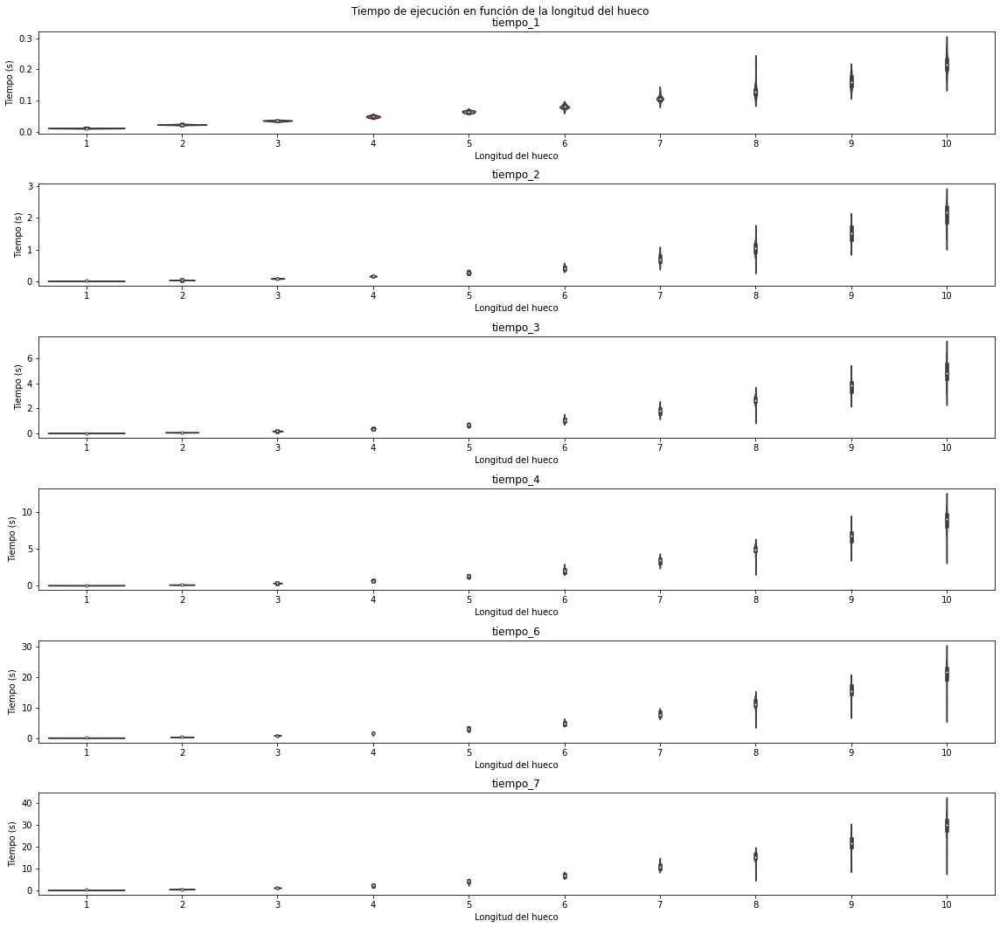

In [20]:

datos_inicio.to_csv('./experimento_inicial_completo.csv', index=False)


fig, axes = plt.subplots(nrows=6,ncols=1, figsize=(16,15) )

for i in range(6):
    sns.violinplot(data=datos_inicio, x='tipo' , y=datos_inicio.columns[i*4+1], ax = axes[i])
    axes[i].title.set_text(datos_inicio.columns[i*4+1])
    axes[i].set_xlabel('Longitud del hueco')
    axes[i].set_ylabel('Tiempo (s)')



plt.suptitle("Tiempo de ejecución en función de la longitud del hueco")
plt.tight_layout()
plt.savefig('./experimento_inicial2_variacion_tiempos.png')


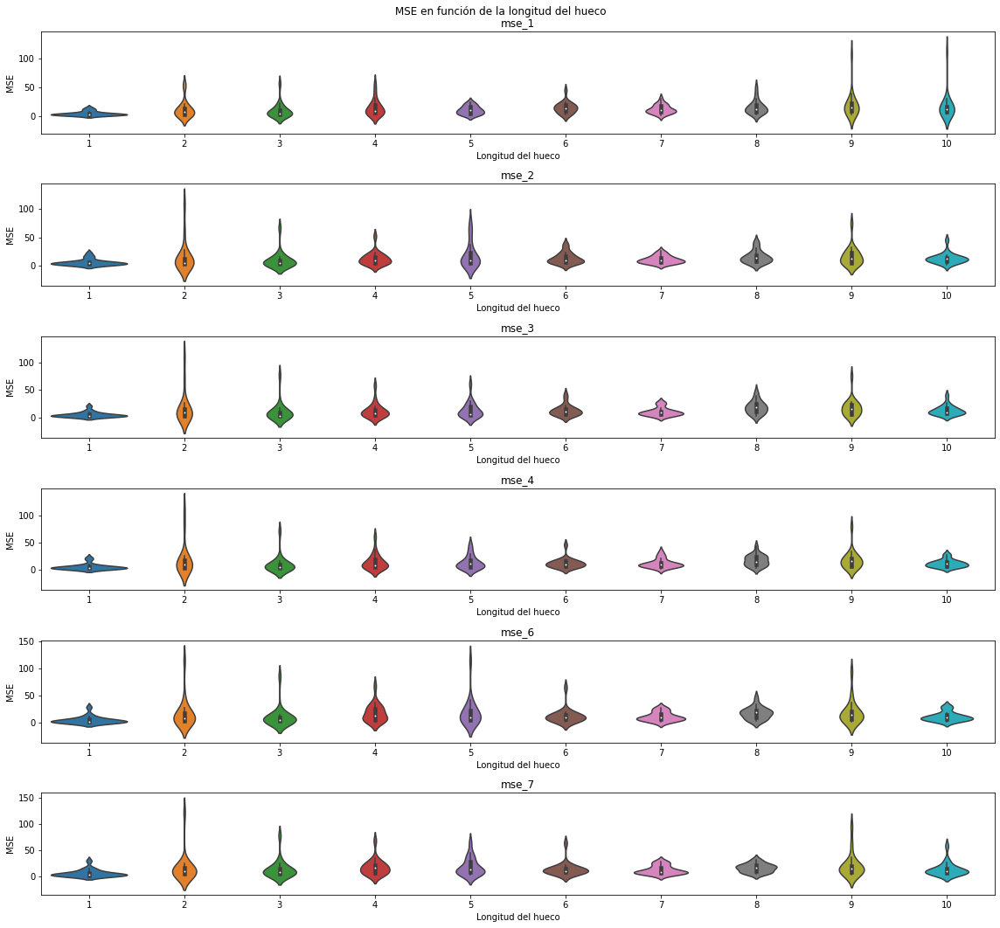

In [24]:
fig, axes = plt.subplots(nrows=6,ncols=1, figsize=(16,15) )



for i in range(6):
    sns.violinplot(data=datos_inicio, x='tipo' , y=datos_inicio.columns[i*4+2], ax = axes[i])
    axes[i].title.set_text(datos_inicio.columns[i*4+2])
    axes[i].set_xlabel('Longitud del hueco')
    axes[i].set_ylabel('MSE')


plt.suptitle("MSE en función de la longitud del hueco")
plt.tight_layout()
plt.savefig('./experimento_inicial2_variacion_mse.png')

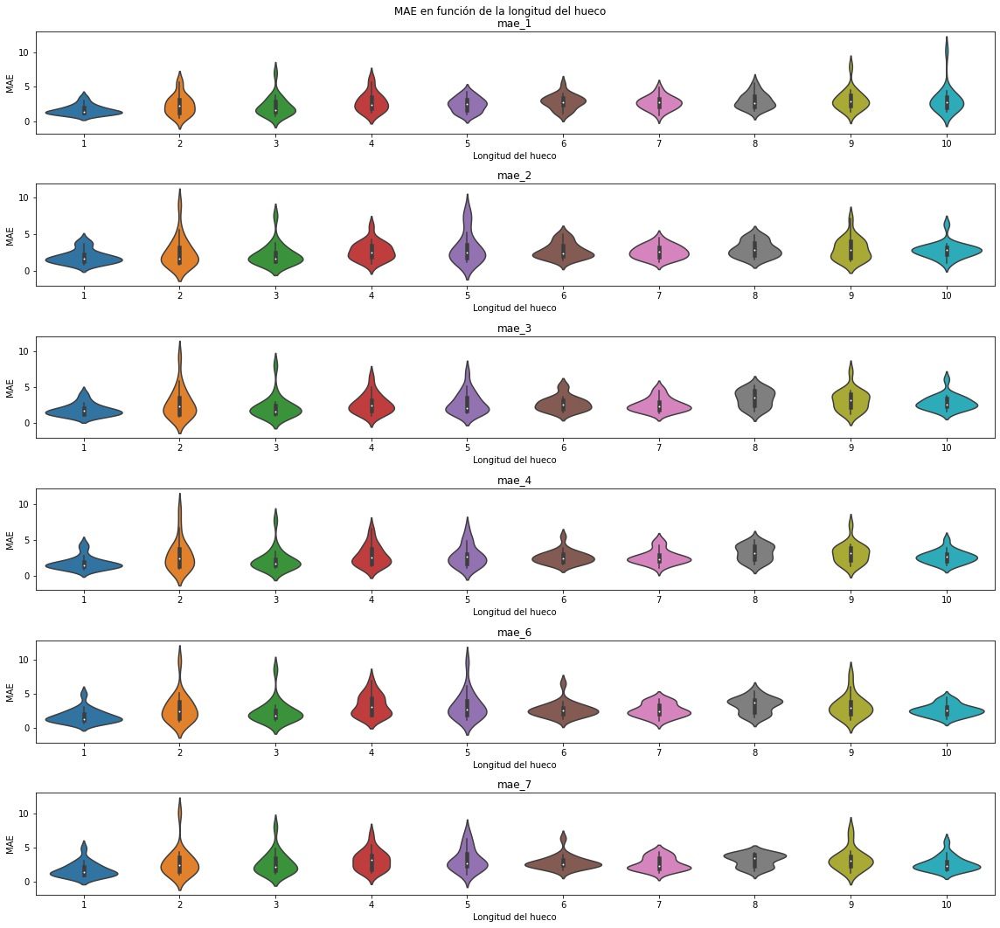

In [25]:
fig, axes = plt.subplots(nrows=6,ncols=1, figsize=(16,15) )



for i in range(6):
    sns.violinplot(data=datos_inicio, x='tipo' , y=datos_inicio.columns[i*4+3], ax = axes[i])
    axes[i].title.set_text(datos_inicio.columns[i*4+3])
    axes[i].set_xlabel('Longitud del hueco')
    axes[i].set_ylabel('MAE')


plt.suptitle("MAE en función de la longitud del hueco")
plt.tight_layout()
plt.savefig('./experimento_inicial2_variacion_mae.png')

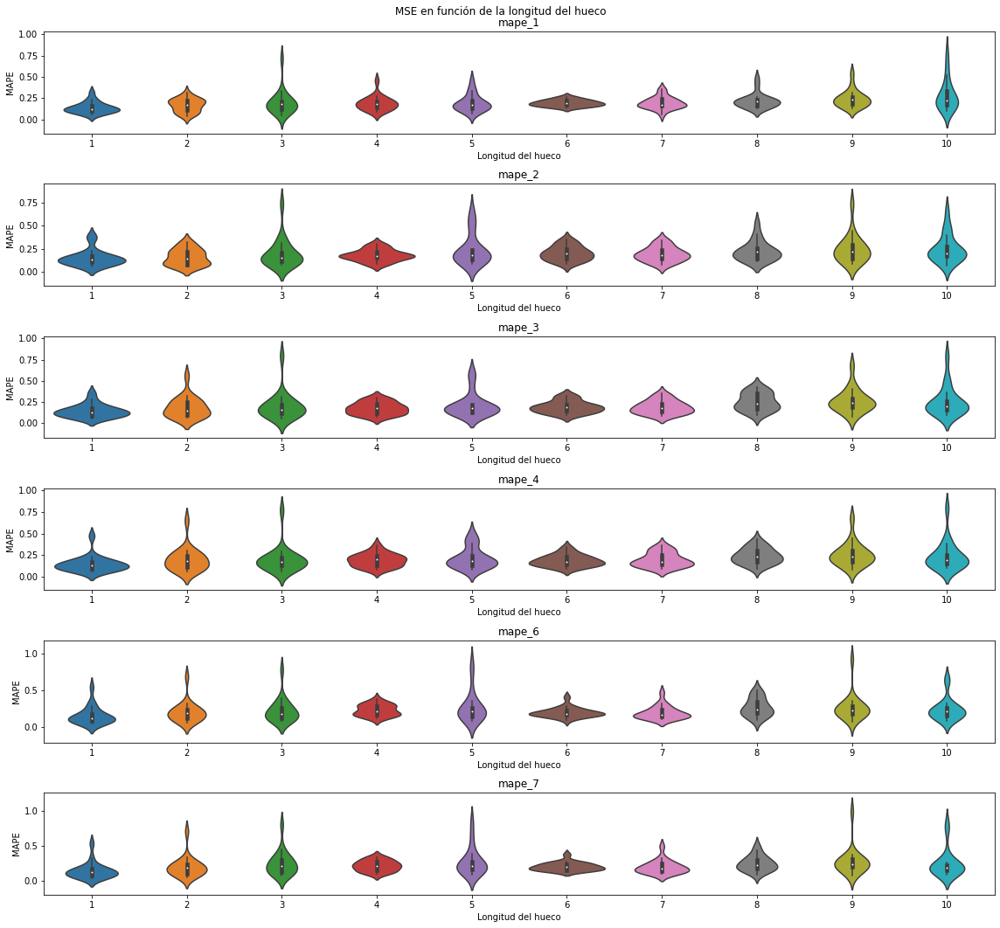

In [26]:
fig, axes = plt.subplots(nrows=6,ncols=1, figsize=(16,15) )



for i in range(6):
    sns.violinplot(data=datos_inicio, x='tipo' , y=datos_inicio.columns[i*4+4], ax = axes[i])
    axes[i].title.set_text(datos_inicio.columns[i*4+4])
    axes[i].set_xlabel('Longitud del hueco')
    axes[i].set_ylabel('MAPE')


plt.suptitle("MSE en función de la longitud del hueco")
plt.tight_layout()
plt.savefig('./experimento_inicial2_variacion_mape.png')

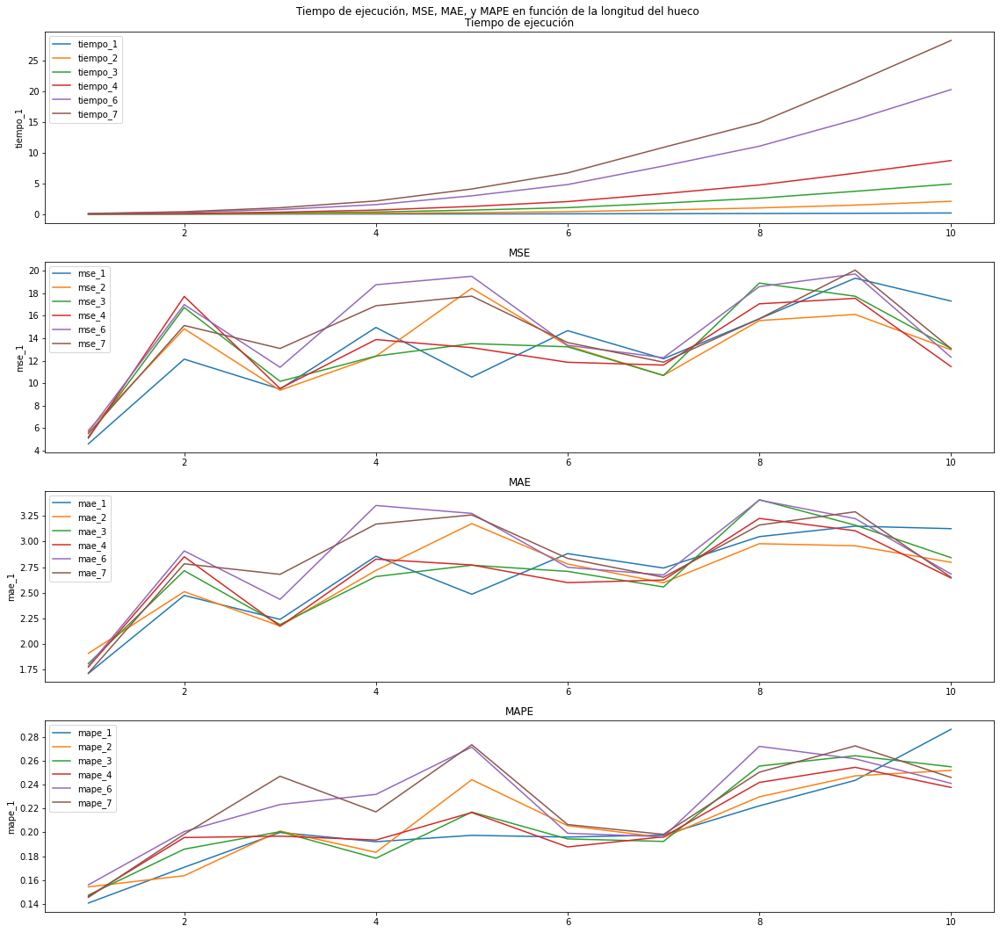

In [28]:
import seaborn as sns
x=np.arange(1,11)
fig, axes = plt.subplots(nrows=4,ncols=1, figsize=(16,15) )

for i in range(6):
    sns.lineplot(x=x, y=datos_inicio.groupby('tipo').mean()[datos_inicio.columns[i*4+1]], label=datos_inicio.columns[i*4+1], ax = axes[0])

for i in range(6):
    sns.lineplot(x=x, y=datos_inicio.groupby('tipo').mean()[datos_inicio.columns[i*4+2]], label=datos_inicio.columns[i*4+2], ax = axes[1])

for i in range(6):
    sns.lineplot(x=x, y=datos_inicio.groupby('tipo').mean()[datos_inicio.columns[i*4+3]], label=datos_inicio.columns[i*4+3], ax = axes[2])

for i in range(6):
    sns.lineplot(x=x, y=datos_inicio.groupby('tipo').mean()[datos_inicio.columns[i*4+4]], label=datos_inicio.columns[i*4+4], ax = axes[3])


axes[0].title.set_text('Tiempo de ejecución')
axes[1].title.set_text('MSE')
axes[2].title.set_text('MAE')
axes[3].title.set_text('MAPE')

plt.suptitle("Tiempo de ejecución, MSE, MAE, y MAPE en función de la longitud del hueco")
plt.tight_layout()
plt.savefig('./experimento_inicial2_detail.png')

In [34]:
b=[np.arange(1,21)]*10
b=[item for sublist in b for item in sublist]


In [35]:
datos_inicio['num_ejecucion']=b

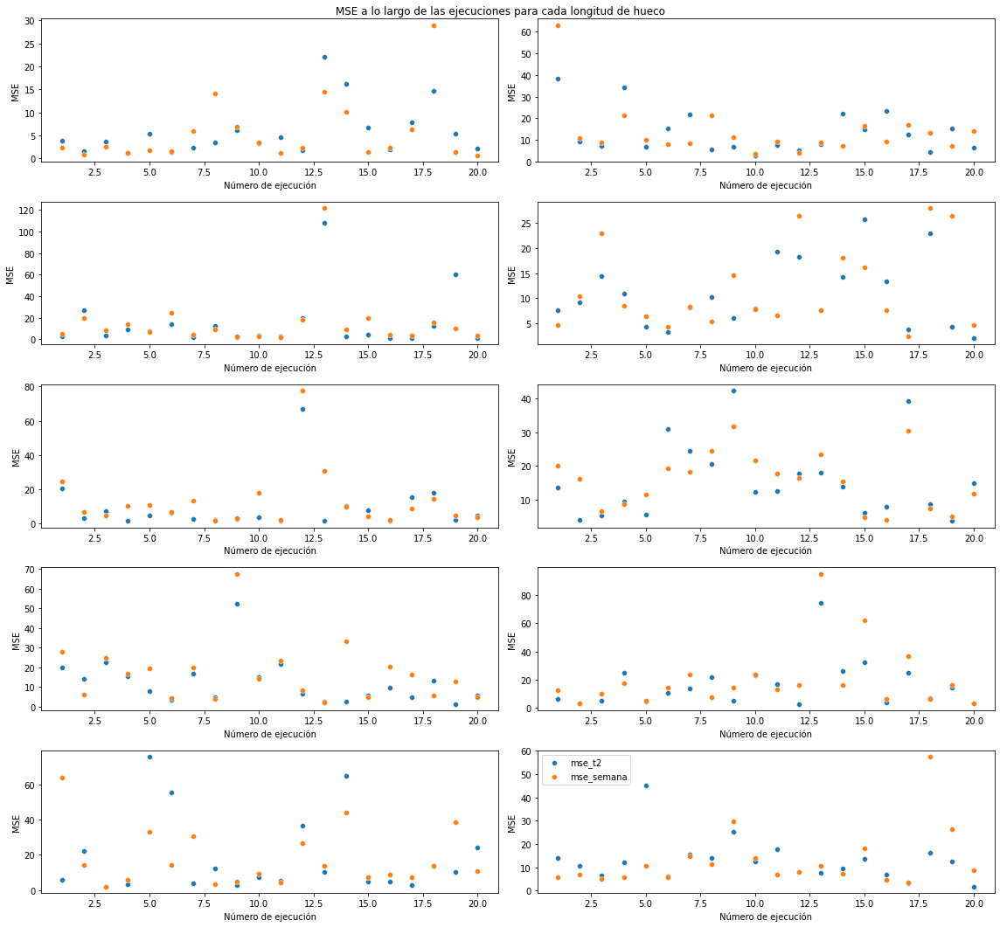

In [37]:
import seaborn as sns
x=np.arange(1,11)
fig, axes = plt.subplots(nrows=5,ncols=2, figsize=(16,15) )


for i in range(10):
    sns.scatterplot(x='num_ejecucion', y='mse_2', data=datos_inicio[datos_inicio['tipo']==i+1], ax = axes[i%5][int(i/5)])
    sns.scatterplot(x='num_ejecucion', y='mse_7', data=datos_inicio[datos_inicio['tipo']==i+1], ax = axes[i%5][int(i/5)])
    axes[i%5][int(i/5)].set_xlabel('Número de ejecución')
    axes[i%5][int(i/5)].set_ylabel('MSE')

plt.legend(['mse_t2', 'mse_semana'])
plt.suptitle("MSE a lo largo de las ejecuciones para cada longitud de hueco")
plt.tight_layout()
plt.savefig('./scatter_final2.png')

## Prueba extra: huecos muy grandes

Vamos a colocar un hueco de 50 días en medio del dataframe, y vamos a comprobar cómo funciona cada algoritmo

In [17]:
df = copia.copy()
df.reset_index(inplace=True)

In [18]:
i=1
#Generamos la longitud: 50 días 
longitud = 50*24*4

index_inicial = random.randint(longitud, (df.shape[0]-2*longitud))
df.iloc[index_inicial:index_inicial+longitud, 1] = np.nan


df1 = df.copy()
df2 = df.copy()
index_final = index_inicial+longitud



In [19]:

fig = go.Figure()
fig.add_trace(
    go.Scatter(x=df.date , y=df[var])
)
fig.update_layout(legend_orientation="v", 
             xaxis_rangeslider_visible=True, xaxis_rangeslider_thickness=0.1, height=600, width=1000 )
fig.show()
#  Vamos a probar haciendo downsampling a 15 minutos


In [20]:

data = obtain_data(df, 1)
start_index, end_index,tipo = data[0]
start_index_peque, end_index_peque=data[1]
fill_small_gaps(df, start_index_peque, end_index_peque, 1)
gaps, days_interpolation = mix_big_gaps(start_index, end_index, tipo)

In [21]:

m=0
k = len(gaps)
freq =4

days = days_interpolation[m]
start_i = gaps[m][0][0]
end_i = gaps[m][-1][1]


# OPCIÓN 1: Prophet
results = interpolate_Prophet(df,1, start_i, end_i)


# OPCIÓN 2: SVR normal
end_gap_anterior = (gaps[m-1][-1][1])if m>0 else 0
start_gap_siguiente = (gaps[m+1][0][0])if m+1!=k else len(df1.index)
# Si el anterior ha acabado hace más de una semana, nos quedamos con el que se hace una semana justa

start_df = start_i-(days*3*freq*24) if (start_i-days*3*freq*24>=0 ) else 0
# Si el sigueinte empieza más tarde de una semana, nos quedamos con la semana siguiente solamente
end_df = end_i+(days*3*freq*24) if (start_gap_siguiente-end_i > days*3*freq*24 ) else start_gap_siguiente


results2 = interpolate_ML(df1,1, start_df, end_df, start_i, end_i)

print("ML 3 días terminado")

#OPCIÓN 3: SVR doble
start_df = start_i-(days*2*freq*24) if (start_i-days*2*freq*24>=0 ) else 0
# Si el sigueinte empieza más tarde de una semana, nos quedamos con la semana siguiente solamente
end_df = end_i+(days*2*freq*24) if (start_gap_siguiente-end_i > days*2*freq*24 ) else start_gap_siguiente


results3 = interpolate_ML(df2,1, start_df, end_df, start_i, end_i)


print("ML 2 días terminado")
for independent_gap in gaps[m]:
    df.iloc[independent_gap[0]+1:independent_gap[1],1]=results[independent_gap[2]:independent_gap[3]-1]
    df1.iloc[independent_gap[0]+1:independent_gap[1],1]=results2[independent_gap[2]:independent_gap[3]-1]
    df2.iloc[independent_gap[0]+1:independent_gap[1],1]=results3[independent_gap[2]:independent_gap[3]-1]







17:05:14 - cmdstanpy - INFO - Chain [1] start processing
17:05:50 - cmdstanpy - INFO - Chain [1] done processing


ML 3 días terminado
ML 2 días terminado


In [22]:
data = [go.Scatter(x=copia.iloc[index_inicial-500:index_final].index,
                   y=copia.iloc[index_inicial-500:index_final][var],
                   name=var+'_original') ,
         go.Scatter(x=df.iloc[index_inicial-500:index_final].date,
                   y=df.iloc[index_inicial-500:index_final][var],
                   name=var+'_prophet'),
        go.Scatter(x=df1.iloc[index_inicial-500:index_final].date,
                   y=df1.iloc[index_inicial-500:index_final][var],
                   name=var+'_svr3'),
        go.Scatter(x=df2.iloc[index_inicial-500:index_final].date,
                   y=df2.iloc[index_inicial-500:index_final][var],
                   name=var+'_svr2')]

layout = go.Layout(
    title='Comparación de dos huecos',
    yaxis=dict(title='Datos'),
    xaxis=dict(title='Date'), width=800, height=400
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(legend_orientation="v", 
             xaxis_rangeslider_visible=True, xaxis_rangeslider_thickness=0.1, height=600, width=800 )
fig.show()

In [23]:

mse_prophet =0
mse_svr =0
mse_doble =0
for i in range(len(start_index)):
    mse_prophet =mse_prophet + mean_squared_error(copia.iloc[start_index[i]+1:end_index[i],0], df.iloc[start_index[i]+1:end_index[i],1])
    mse_svr =mse_svr + mean_squared_error(copia.iloc[start_index[i]+1:end_index[i],0], df1.iloc[start_index[i]+1:end_index[i],1])
    mse_doble =mse_doble + mean_squared_error(copia.iloc[start_index[i]+1:end_index[i],0], df2.iloc[start_index[i]+1:end_index[i],1])
mse_prophet =mse_prophet/len(start_index)
mse_svr =mse_svr/len(start_index)
mse_doble =mse_doble/len(start_index)

print("MSE Prophet: ", mse_prophet)
print("MSE SVR: ", mse_svr)
print("MSE SVR doble: ", mse_doble)

MSE Prophet:  11.369798944894912
MSE SVR:  14.217055083649738
MSE SVR doble:  10.18282832811243
